# **Weakly Supervised Semantic Segmentation using Foundation Models (FMA-WSSS)**
This notebook implements a weakly supervised approach for semantic segmentation using CLIP and SAM foundation models. We'll leverage image-level labels to generate pseudo-masks and train a segmentation model.

**Key Implementation Details:**

1. **CLIP-SAM Synergy**: Combines CLIP's category-aware understanding with SAM's segmentation capabilities

2. **Dynamic Thresholding**: Adaptive threshold for mask combination based on CAM activation statistics

3. **Memory Efficiency**: Uses ViT-B models to balance performance and memory constraints

\

### Process Flowchart:
[![](https://mermaid.ink/img/pako:eNqVlV1vokAUhv_KZDa9mzYCVZAmmyjgpknNNu3uXqz2YgpnlBSBDEOrrf3vexhApdFmizEB5jzvnDlfvNEwi4C6dCF5viQ3d_OU4DWaXad5qcj1ii-AWGvTvKz-D-T8_DsZz7yb61syAa5KCSRYK8lDFWfpQw2PtZU3-wEpSK6AeAkvCjJCm2de2ZEpz-fz9D5-BZe00jXradaf3Y-maFU8kTsQcQorSFVj4WuLYFYvRGQcp1xuauOuVqAtJzMfIL_hj38sMsWzJuSX5HEapwt04SVWS9IqVRIFsjV9dkZGUYRmJIIilHGO3gNJUaEgIpMkTLiM1aY2LsrHOoAjg3RCdyuzEIoCZRqndHTrW0ijD_QY6c9jq-N7CvcQ70aZNDnoCninBHwUOB15Hf1TaIDoYSDJz1JhGA7Q4BQ6QbSbmQNqckDtEnOvNkmVGbVsMlKvhHWdsTHzmM8CNiF5Hf6r7rrHAhJxxa-OSLZe1Ul-BKVAkue4KHlCFjIr86pwDtUMNjaYZzDfYIHB8Cz7PXfiXpZkUqvjLsfqR2v5IFqYiDhJ3G9giL4AViiZPYH7rWc6TmQ0j-cvcaSWrpmvrz5oVEdrBBDH307AsqwubWh65-c0w5qTTRabQ2uXj1S8fj1qHe0JW_D_dLRGxy1qCVNEX0K9FnVEH4b70zkOWOHnqN-goQOD8Gto0MbUEM4Xd520qBAR2DtU9G1h2MfQzgiquhcTEYHicXKkePS83QZpNcnrsbNt-1SP0-1-EI-muyU9R7eHLbttW1QPzu3vAt9Xm7Vdua2akTL8VMQRdZUsgdEVyBWvHulbxc4ptuQK5tTF2wgELxM1p_P0HbGcp3-zbNWS2EuLJXUFTwp8KnOsWvBjjs23N8GuB-llZaqoa2sF6r7RNXVN277oO73e0DAHQ6uPQaQbfGtcDC370radvj0YDsz-O6OvesvehWNfDg8vRgEjm8lp_fnTX8H3fx2MORk?type=png)](https://mermaid.live/edit#pako:eNqVlV1vokAUhv_KZDa9mzYCVZAmmyjgpknNNu3uXqz2YgpnlBSBDEOrrf3vexhApdFmizEB5jzvnDlfvNEwi4C6dCF5viQ3d_OU4DWaXad5qcj1ii-AWGvTvKz-D-T8_DsZz7yb61syAa5KCSRYK8lDFWfpQw2PtZU3-wEpSK6AeAkvCjJCm2de2ZEpz-fz9D5-BZe00jXradaf3Y-maFU8kTsQcQorSFVj4WuLYFYvRGQcp1xuauOuVqAtJzMfIL_hj38sMsWzJuSX5HEapwt04SVWS9IqVRIFsjV9dkZGUYRmJIIilHGO3gNJUaEgIpMkTLiM1aY2LsrHOoAjg3RCdyuzEIoCZRqndHTrW0ijD_QY6c9jq-N7CvcQ70aZNDnoCninBHwUOB15Hf1TaIDoYSDJz1JhGA7Q4BQ6QbSbmQNqckDtEnOvNkmVGbVsMlKvhHWdsTHzmM8CNiF5Hf6r7rrHAhJxxa-OSLZe1Ul-BKVAkue4KHlCFjIr86pwDtUMNjaYZzDfYIHB8Cz7PXfiXpZkUqvjLsfqR2v5IFqYiDhJ3G9giL4AViiZPYH7rWc6TmQ0j-cvcaSWrpmvrz5oVEdrBBDH307AsqwubWh65-c0w5qTTRabQ2uXj1S8fj1qHe0JW_D_dLRGxy1qCVNEX0K9FnVEH4b70zkOWOHnqN-goQOD8Gto0MbUEM4Xd520qBAR2DtU9G1h2MfQzgiquhcTEYHicXKkePS83QZpNcnrsbNt-1SP0-1-EI-muyU9R7eHLbttW1QPzu3vAt9Xm7Vdua2akTL8VMQRdZUsgdEVyBWvHulbxc4ptuQK5tTF2wgELxM1p_P0HbGcp3-zbNWS2EuLJXUFTwp8KnOsWvBjjs23N8GuB-llZaqoa2sF6r7RNXVN277oO73e0DAHQ6uPQaQbfGtcDC370radvj0YDsz-O6OvesvehWNfDg8vRgEjm8lp_fnTX8H3fx2MORk)

## 1. Prepare Environment

In [1]:
import sys

!pip uninstall -q torch numpy -y

colab_run = True
if colab_run:
    # Install PyTorch with CUDA 11.8, compatible with torchvision 0.15.2
    !pip install -q torch==2.0.0+cu118 torchvision==0.15.1+cu118 -f https://download.pytorch.org/whl/torch_stable.html
    
    # Install other required packages
    !pip install -q numpy==1.23.5
    !pip install -q git+https://github.com/openai/CLIP.git
    !pip install -q segment-anything-py

    import torch
    import torchvision
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"PyTorch version: {torch.__version__}")
    print(f"Torchvision version: {torchvision.__version__}")
    print(f"Using device: {device}")

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
catboost 1.2.7 requires numpy<2.0,>=1.16.0, but you have numpy 2.2.4 which is incompatible.
cupy-cuda12x 12.2.0 requires numpy<1.27,>=1.20, but you have numpy 2.2.4 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.4 which is incompatible.
langchain 0.3.12 requires async-timeout<5.0.0,>=4.0.0; python_version < "3.11", but you have async-timeout 5.0.1 which is incompatible.
langchain 0.3.12 requires numpy<2,>=1.22.4; python_version < "3.12", but you have numpy 2.2.4 which is incompatible.
matplotlib 3.7.5 requires numpy<2,>=1.20, but you have numpy 2.2.4 which is incompatible.
mkl-fft 1.3.8 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.4 which is incompatible.
mkl-random 1.2.4 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.4 which is incompatible.
mkl-umath 0.1

## 2. Dataset Preparation
Load Oxford-IIIT Pets dataset with image-level labels only:

In [2]:
from torchvision.datasets import OxfordIIITPet
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F


class WeaklyAnnotatedOxfordPet(OxfordIIITPet):
    def __getitem__(self, index):
        img, _ = super().__getitem__(index)
        label = self._labels[index]
        return img, torch.tensor(label, dtype=torch.long) 


transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),                 # [0,1] range
])


train_dataset = WeaklyAnnotatedOxfordPet(root='./data', split='trainval', download=True, transform=transform)
test_dataset = WeaklyAnnotatedOxfordPet(root='./data', split='test', download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

img, label = train_dataset[0]
print(f"Image shape: {img.shape}, Label: {label}")

Train dataset size: 3680
Test dataset size: 3669
Image shape: torch.Size([3, 224, 224]), Label: 0


## 3. CLIP-based Class Activation Mapping (CAM)
Generate initial pseudo-masks using CLIP's zero-shot capabilities. 

In [3]:
import clip

clip_model, _ = clip.load("ViT-B/32", device=device)


def generate_cam(image, label):
    with torch.no_grad():
        # inputs
        image = image.unsqueeze(0).to(device) if image.dim() == 3 else image.to(device)

        prompts = [
            f"a photo of a {label}",
            f"a cropped photo of {label}",
            f"a photo of {label} dark background",
            f"a photo of {label} bright background",
            f"{label} in context"
        ]
        
        # fetch text features
        text = clip.tokenize(prompts).to(device)
        with torch.no_grad():
            text_features = clip_model.encode_text(text).mean(dim=0, keepdim=True)
        
        # forward pass w CLIP
        image_features = clip_model.encode_image(image)
        
        # similarity
        similarity = (image_features @ text_features.T).squeeze()
        
        # conv layer for visual features (rather than direct attention)
        x = image.type(clip_model.dtype)
        feature_maps = clip_model.visual.conv1(x)  # shape: [batch_size, width, grid, grid]
        
        # activation map
        cam = feature_maps.mean(dim=1)             # mean by channels
        
        # resize
        cam = F.interpolate(cam.unsqueeze(1), size=(224, 224), mode='bilinear', align_corners=False)
        cam = cam.squeeze()
        
        # sim score weighting
        if similarity.dim() > 0:
            similarity = similarity[0]
        cam = cam * similarity.item()
        
        # normalise (can trial and error here)
        # cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        
        return cam

## 4. SAM-based Mask Refinement
Use SAM to refine CLIP-generated CAMs:

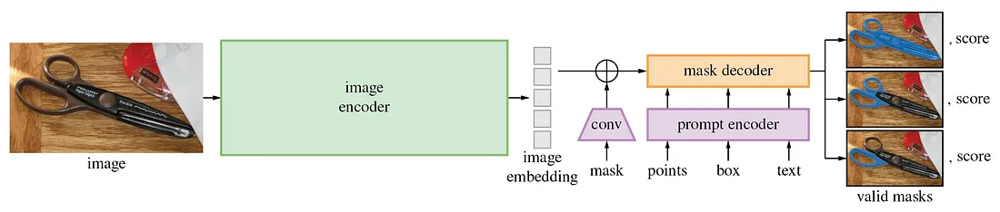

In [4]:
from segment_anything import SamPredictor, sam_model_registry
import requests
import numpy as np

# download SAM ViT-B checkpoint
url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
response = requests.get(url)
with open("sam_vit_b_01ec64.pth", "wb") as f:
    f.write(response.content)

print("Checkpoint downloaded successfully.")

# initialise the model + predictor
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
sam.to(device)
predictor = SamPredictor(sam)

def refine_mask(image, cam):
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * 255).astype(np.uint8)

    # set image in SAM
    predictor.set_image(image_np)

    # convert CAM to NumPy and scale to [0, 255]
    cam_np = (cam.cpu().numpy() * 255).astype(np.uint8)

    # threshold the CAM to select the most activated region
    cam_thresholded = np.where(cam_np > np.percentile(cam_np, 90), 1, 0)  # Top 10% of CAM values

    # centre of largest active region (from ES-CLIP)
    activated_pixels = np.argwhere(cam_thresholded == 1)
    if len(activated_pixels) > 0:
        center = np.mean(activated_pixels, axis=0)
        input_point = np.array([center[::-1]]) 
    else:
        # default centre with no active regions from CAM
        input_point = np.array([[112, 112]])  

    # image label 
    input_label = np.array([1])

    # predict mask w SAM 
    masks, _, _ = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        box=None,                           # No bounding box (TODO)
        multimask_output=False
    )

    return torch.from_numpy(masks[0]).float()



def sam_masker(image):
    """
    SAM only segmentation
    """
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * 255).astype(np.uint8)

    # set image in SAM predictor
    predictor.set_image(image_np)

    # region of interest (default centre)
    input_point = np.array([[112, 112]])  
    input_label = np.array([1]) 

    # SAM to predict mask
    masks, _, _ = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        box=None,                           # No bounding box (TODO)
        multimask_output=False
    )

    return torch.from_numpy(masks[0]).float()

Checkpoint downloaded successfully.


## 5. Segmentation Model Training
Implement DeepLabV3 with pseudo-labels:

In [5]:
from torchvision.models.segmentation import deeplabv3_resnet50

# Estimate pseudo-supervised Segmentation w ResNET 
num_classes = len(train_dataset.classes)
model = deeplabv3_resnet50(num_classes=num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

## 6. Run Training...

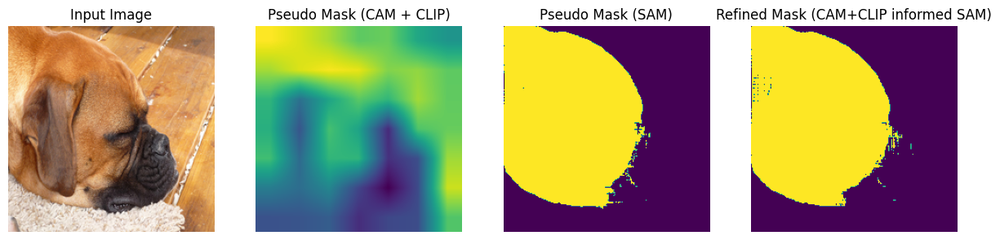

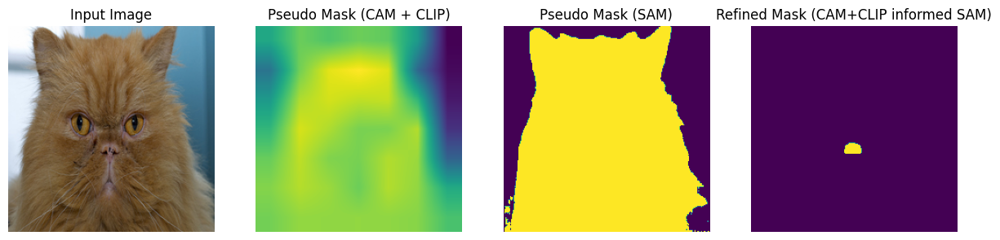

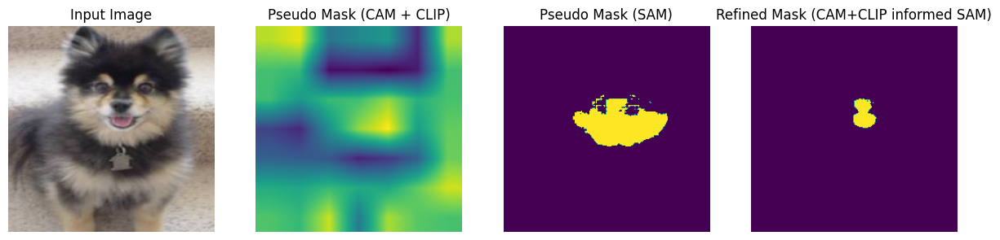

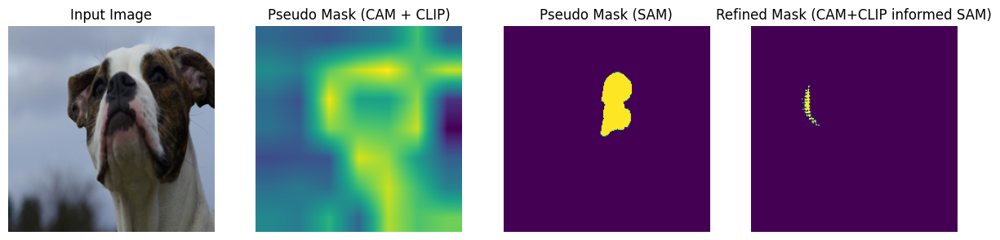

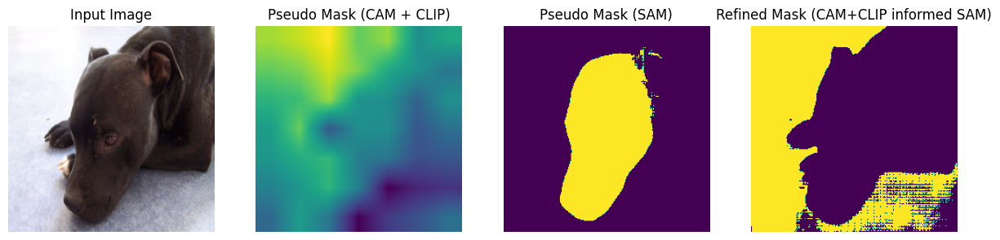

...

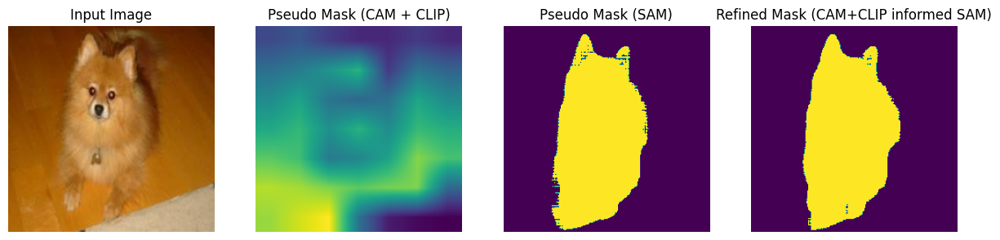

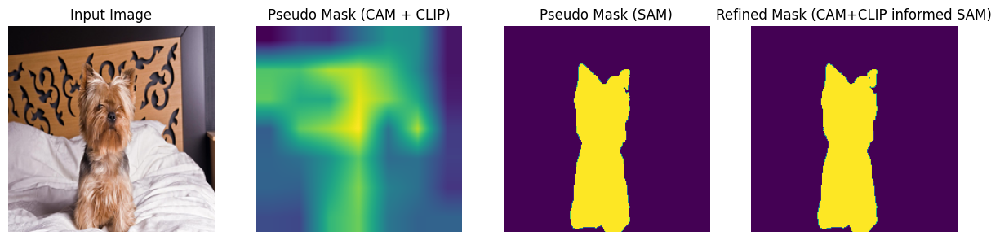

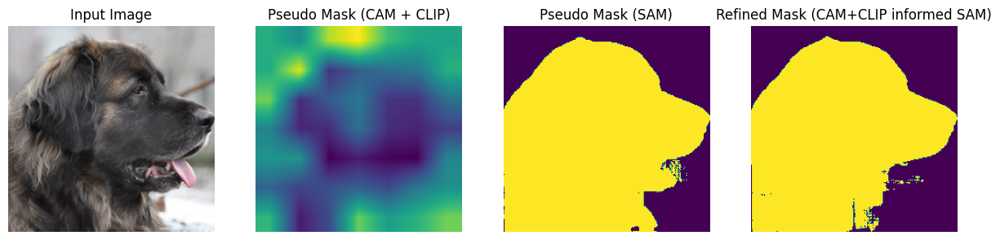

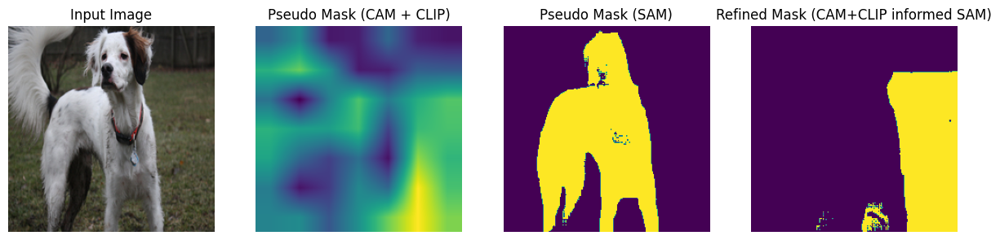

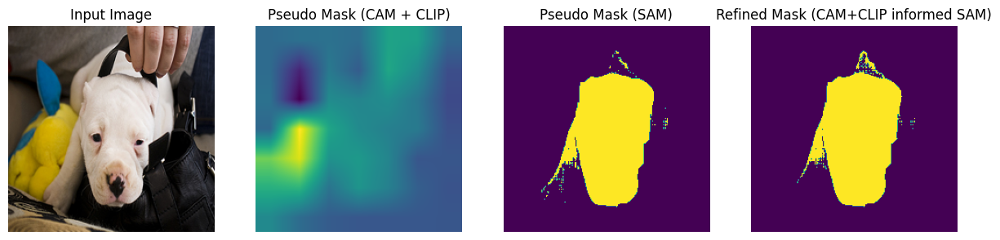

KeyboardInterrupt: 

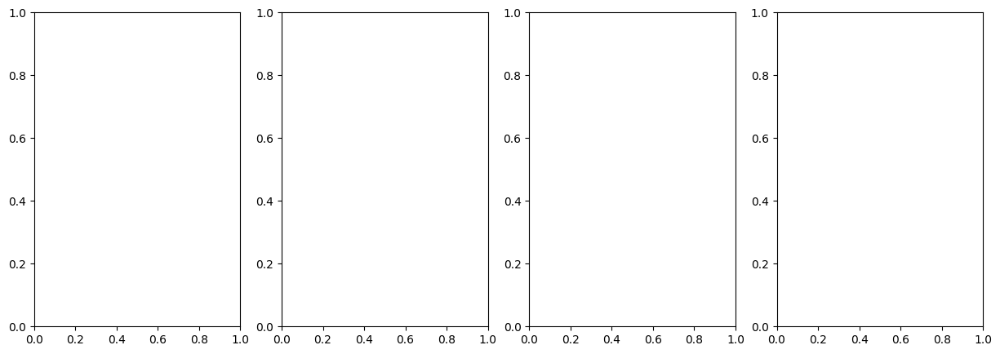

In [6]:
import matplotlib.pyplot as plt
import time


num_epochs = 1
visualize_every_n_batches = 1 

for epoch in range(num_epochs):
    model.train()
    for batch_idx, (images, labels) in enumerate(train_loader):
        images, labels = images.to(device), labels.to(device)

        # gen pseudo-masks
        pseudo_masks = torch.stack([generate_cam(img, train_dataset.classes[lbl]) for img, lbl in zip(images, labels)])
        # refine
        refined_masks = torch.stack([refine_mask(img, cam) for img, cam in zip(images, pseudo_masks)]).to(device)

        # just SAM
        SAM_masks = torch.stack([sam_masker(img) for img in images]).to(device)
        
        # train segmentation model on pseudos
        outputs = model(images)['out']
        loss = F.cross_entropy(outputs, refined_masks.long())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # visualising training
        if batch_idx % visualize_every_n_batches == 0:
            fig, ax = plt.subplots(1, 4, figsize=(15, 5))
            idx = 0  # first in batch

            output = outputs[idx].cpu()
            # Apply softmax to get probabilities
            #output_probs = F.softmax(output, dim=0)
            # Get the predicted class for each pixel
            #final = output_probs.argmax(dim=0).numpy()

            img = images[idx].cpu().permute(1, 2, 0).numpy()
            pseudo_masks = pseudo_masks[idx].cpu().numpy()
            mask = refined_masks[idx].cpu().numpy()
            sams = SAM_masks[idx].cpu().numpy()

            ax[0].imshow(img)
            ax[0].set_title("Input Image")
            ax[0].axis("off")

            ax[1].imshow(pseudo_masks)
            ax[1].set_title("Pseudo Mask (CAM + CLIP)")
            ax[1].axis("off")

            ax[2].imshow(sams)
            ax[2].set_title("Pseudo Mask (SAM)")
            ax[2].axis("off")

            ax[3].imshow(mask)
            ax[3].set_title("Refined Mask (CAM+CLIP informed SAM)")
            ax[3].axis("off")

            # no point showing as needs to be trained
            # ax[4].imshow(final)
            # ax[4].set_title("Final Mask")
            # ax[4].axis("off")

            plt.show()
            time.sleep(1)  # render time

    # validation (no disk space!!)
    model.eval()
    with torch.no_grad():
        val_loss = 0
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)['out']
            val_loss += F.cross_entropy(outputs, labels.long()).item()

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {loss.item():.4f}, Val Loss: {val_loss/len(test_loader):.4f}")
